In [1]:
import torch.utils.data
import random
from os import path
import numpy as np
import torch
import torchvision.transforms as transforms
import dataloaders
from numpy import asarray
from torchvision.transforms.functional import to_pil_image
from matplotlib.pyplot import subplots

from networks import dcgan
from networks import wdcgan_gp
from networks import sndcgan
from networks import rdcgan
from networks import cdcgan
from networks import wcdcgan_gp
from networks import sncdcgan
from networks import rcdcgan

from networks.utils import compute_kid_score
from networks.utils import plot_grid
from sample_and_visualize import sample_and_visualize

In [2]:
USE_CUDA = True
if USE_CUDA and torch.cuda.is_available():
    device = 'cuda'  #alt: "cuda:0"
else:
    device = 'cpu'

PIN_MEMORY = True
USE_MULTI_PROCESS_DATA_LOADING = True
if USE_MULTI_PROCESS_DATA_LOADING:
    NUM_THREADS = torch.get_num_threads()
    print("Number of Threads: ", NUM_THREADS)
else:
    NUM_THREADS = 0
    print("Not using Multi-Process Data Loading.")

SEED = 0
random.seed(SEED)
torch.manual_seed(SEED);

### Data
DATA_PATH = path.join("data", "tmdb-64")
TABLE_PATH = path.join("data", "tmdb-movies-220915-clean.pkl")

Number of Threads:  8


In [3]:
### Architecture
IMAGE_SIZE = 64
IMAGE_SIZE_RATIO = 3
NUM_IMG_CHANNELS = 3
NUM_NOISE_VEC_CHANNELS = 100
NUM_FEATURE_VEC_CHANNELS = 37
BASE_NUM_OUT_CHANNELS_G_non_conditional = 64
BASE_NUM_OUT_CHANNELS_G_conditional = 128
BASE_NUM_OUT_CHANNELS_D = 64
D_NORM_LAYER_TYPE = "instance"
PADDING_MODE = "reflect"
COLORMODE="RGB"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Poster subset:
GENRE = None
GENRE_LOGIC = 'and'
OG_LANG = None
YEAR = None
RUNTIME = (40, np.inf)
MAX_NUM = None
SORT = None

BATCH_SIZE = 100
mode = "generated"
iterations = 5
seed = 7777777
compute_kid = False

genres = ["is_thriller", "is_western", "is_music"]
languages = ["lang_en", "lang_ar", "lang_ja", "lang_zh", "lang_ru"]

In [4]:
poster_dataset = dataloaders.PosterDataset(table_path=TABLE_PATH, img_root_path=DATA_PATH,
                                           img_transform=transforms.Compose([
                                               transforms.ToTensor(),
                                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]),
                                           colormode=COLORMODE,
                                           img_in_ram=False,
                                           genre=GENRE, genre_logic=GENRE_LOGIC, og_lang=OG_LANG, year=YEAR,
                                           runtime=RUNTIME,
                                           max_num=MAX_NUM, sort=SORT)

posterloader = torch.utils.data.DataLoader(poster_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_THREADS,
                                           pin_memory=PIN_MEMORY)

In [5]:
from torchvision.utils import make_grid


def demonstrate_model(model_name, generator, compute_kid, conditional=False, trunc_theshold=None, num_imgs=4):
    print(model_name)
    model_to_load = f"data\\saved_models\\{model_name}\\model.pt"
    generator.load_state_dict(torch.load(model_to_load)['generator_model_state_dict'])
    generator.eval()
    num_features = None
    if conditional:
        print("Full conditional grid:\n")
        plot_grid(generator, NUM_NOISE_VEC_CHANNELS, device, seed, 20, 30, f"{model_name}_conditional_grid.png", trunc_theshold)
        print("Limited conditional grid:\n")
        plot_grid(generator, NUM_NOISE_VEC_CHANNELS, device, seed, 20, 30, f"{model_name}_conditional_grid_limited.png",
                  genres, languages, trunc_theshold)
        num_features = NUM_FEATURE_VEC_CHANNELS
    else:
        print("Samples:\n")
        if trunc_theshold:
            sample_and_visualize(generator, NUM_NOISE_VEC_CHANNELS, IMAGE_SIZE_RATIO, num_imgs, device, trunc_theshold)
        else:
            noise = torch.randn(num_imgs, NUM_NOISE_VEC_CHANNELS, IMAGE_SIZE_RATIO, 1, device=device)
            fake = generator(noise).detach().cpu()
            images = make_grid(fake[:num_imgs].to(device), padding=2, normalize=True).cpu()
            if not isinstance(images, list):
                images = [images]
            fig, axs = subplots(ncols=len(images), squeeze=False)
            for i, img in enumerate(images):
                img = img.detach()
                img = to_pil_image(img)
                axs[0, i].imshow(asarray(img))
                axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
            fig.savefig(path.join(f"{model_name}_samples.png"))
    print("KID score:\n")
    if compute_kid:
        _, _ = compute_kid_score(generator, posterloader, mode, iterations, BATCH_SIZE, NUM_NOISE_VEC_CHANNELS,
                          IMAGE_SIZE_RATIO, device, num_features)

DCGAN
Samples:

KID score:



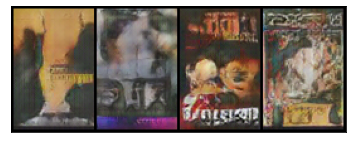

In [6]:
generator, _ = dcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                            num_img_channels=NUM_IMG_CHANNELS,
                                            num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                            base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                            device=device)
demonstrate_model("DCGAN", generator, compute_kid=compute_kid, conditional=False)

In [7]:
generator, _ = wdcgan_gp.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                             num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                             base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                             base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                             d_norm_layer_type=D_NORM_LAYER_TYPE, padding_mode=PADDING_MODE,
                                             device=device)
#demonstrate_model("WDCGAN", generator, compute_kid=compute_kid, conditional=False)

In [8]:
generator, _ = sndcgan.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                              num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                              base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                              base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                              device=device)
#demonstrate_model("SNDCGAN", generator, compute_kid=compute_kid, conditional=False)

In [9]:
generator, discriminator = rdcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                            num_img_channels=NUM_IMG_CHANNELS,
                                            num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                            base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                            device=device)
#demonstrate_model("RaDCGAN", generator, compute_kid=compute_kid, conditional=False)

cDCGAN
Full conditional grid:



D:\ProgramData\Anaconda3\lib\site-packages\torch\nn\init.py:46: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is C:\Users\user\AppData\Local\Temp/torch/kernels. This warning will appear only once per process. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cuda\jit_utils.cpp:860.)
  tensor.erfinv_()


Limited conditional grid:

KID score:



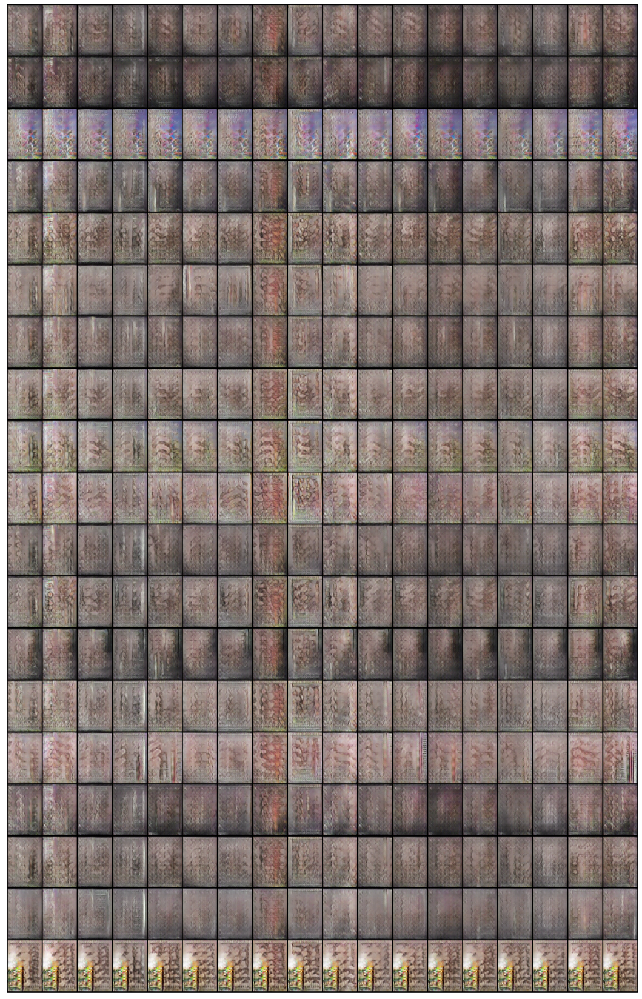

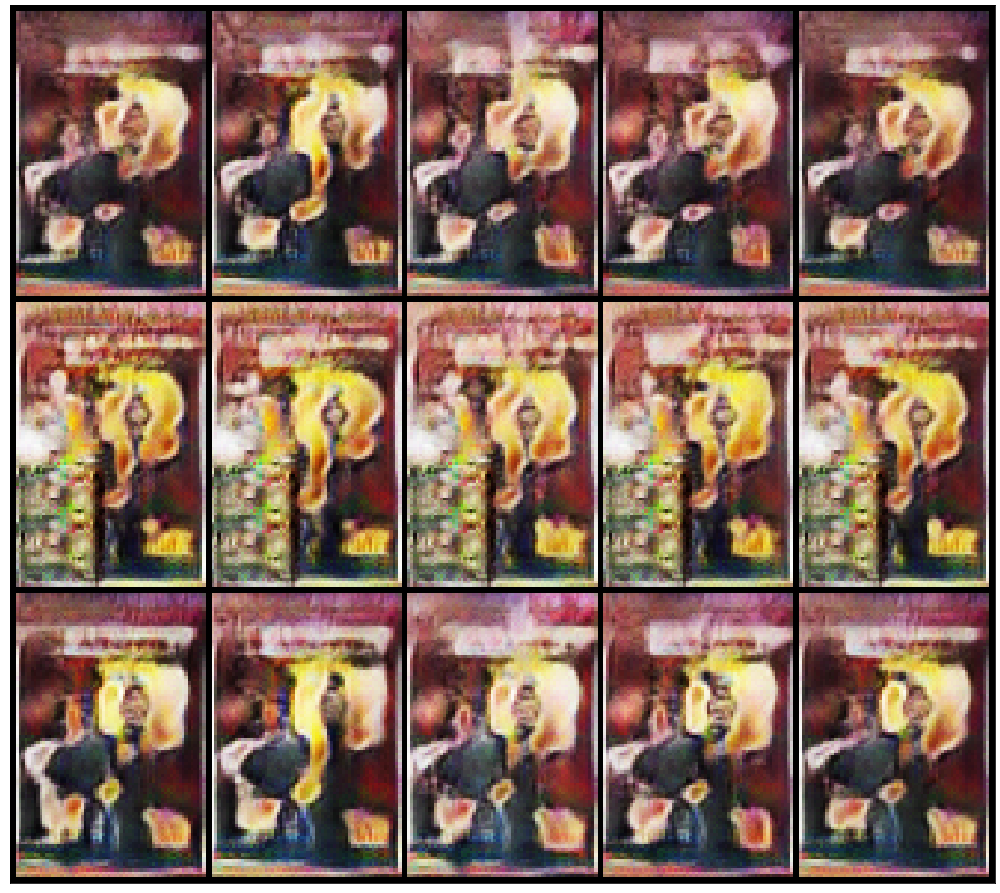

In [10]:
generator, _ = cdcgan.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                             num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                             base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                             base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                             num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS, device=device)
demonstrate_model("cDCGAN", generator, compute_kid=compute_kid, conditional=True)

WcDCGAN
Full conditional grid:

Limited conditional grid:

KID score:



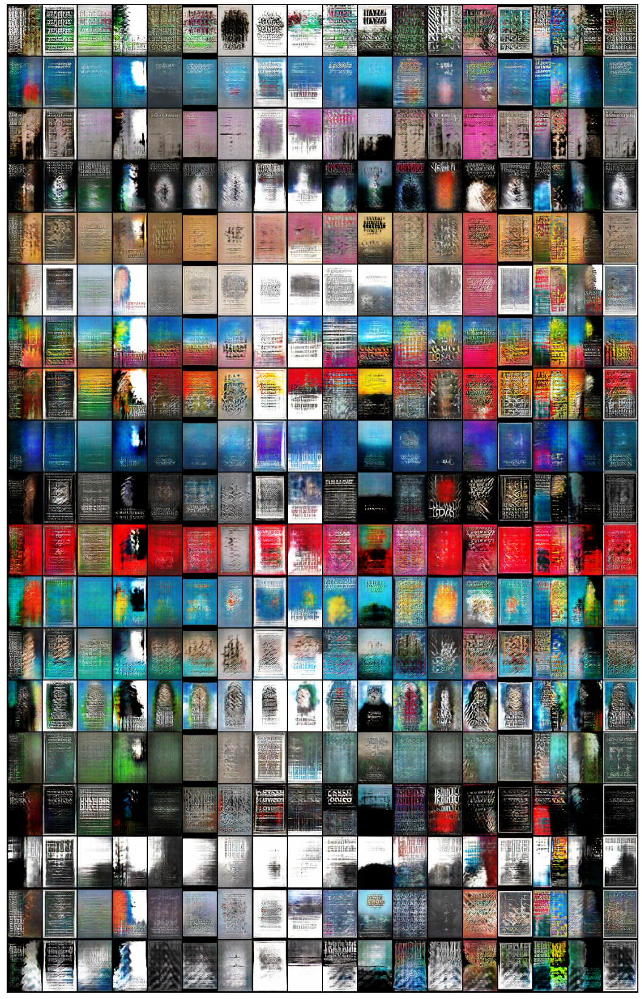

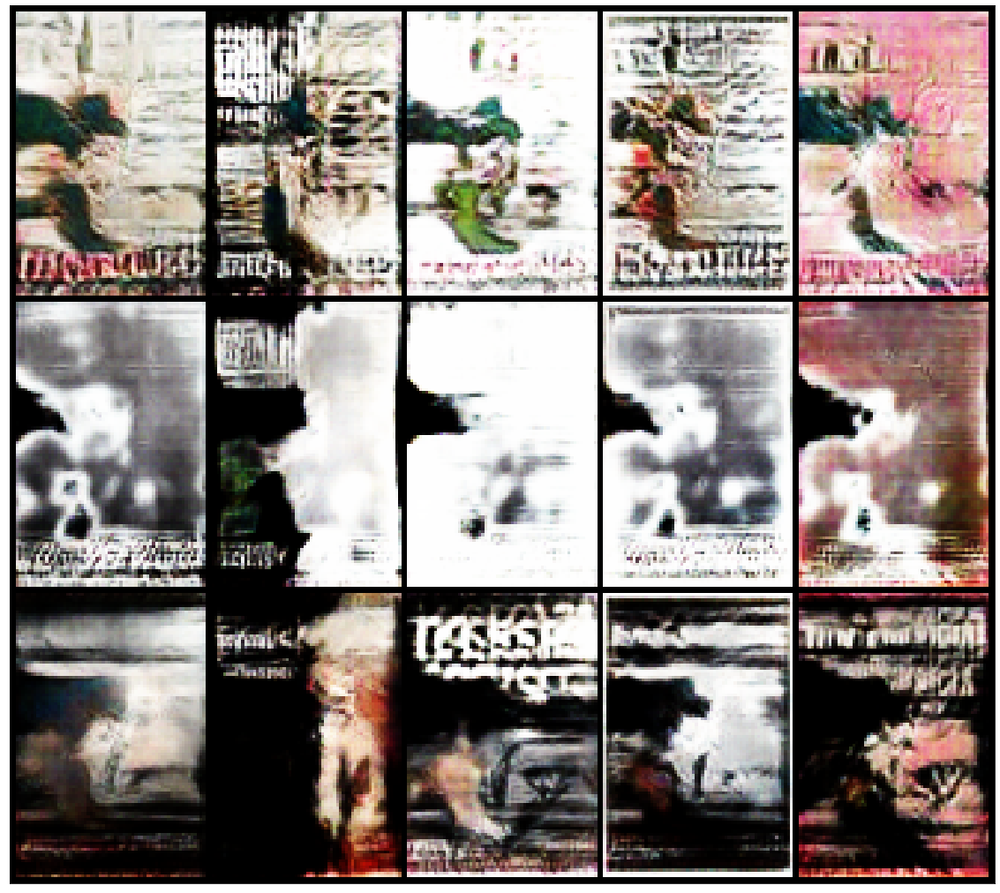

In [11]:
generator, _ = wcdcgan_gp.create_gan(num_img_channels=NUM_IMG_CHANNELS, num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                    base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                    base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                    num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS,
                                    d_norm_layer_type=D_NORM_LAYER_TYPE, device=device)
demonstrate_model("WcDCGAN", generator, compute_kid=compute_kid, conditional=True)

SNcDCGAN
Full conditional grid:

Limited conditional grid:

KID score:



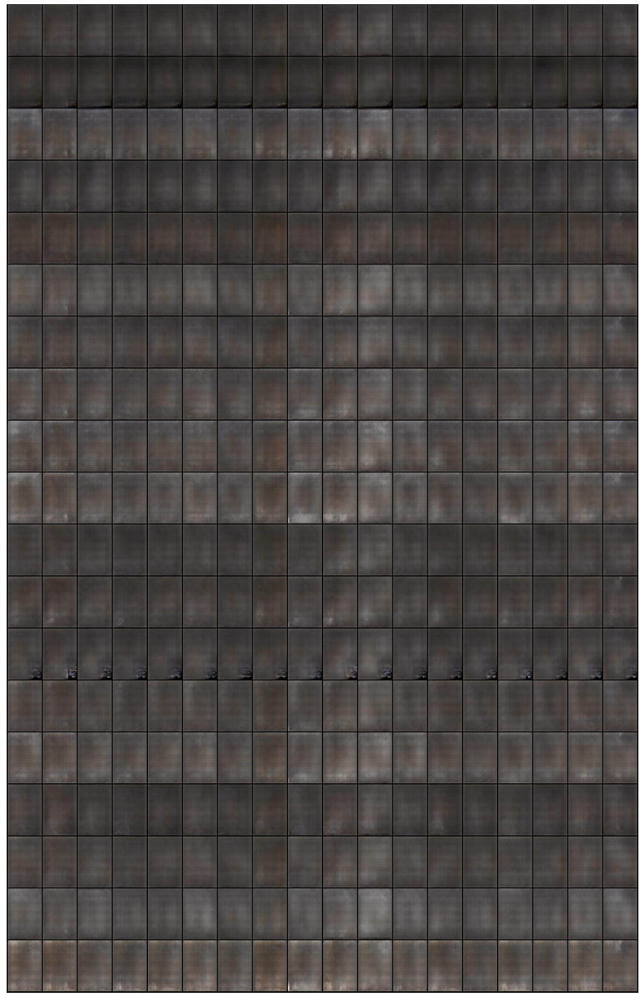

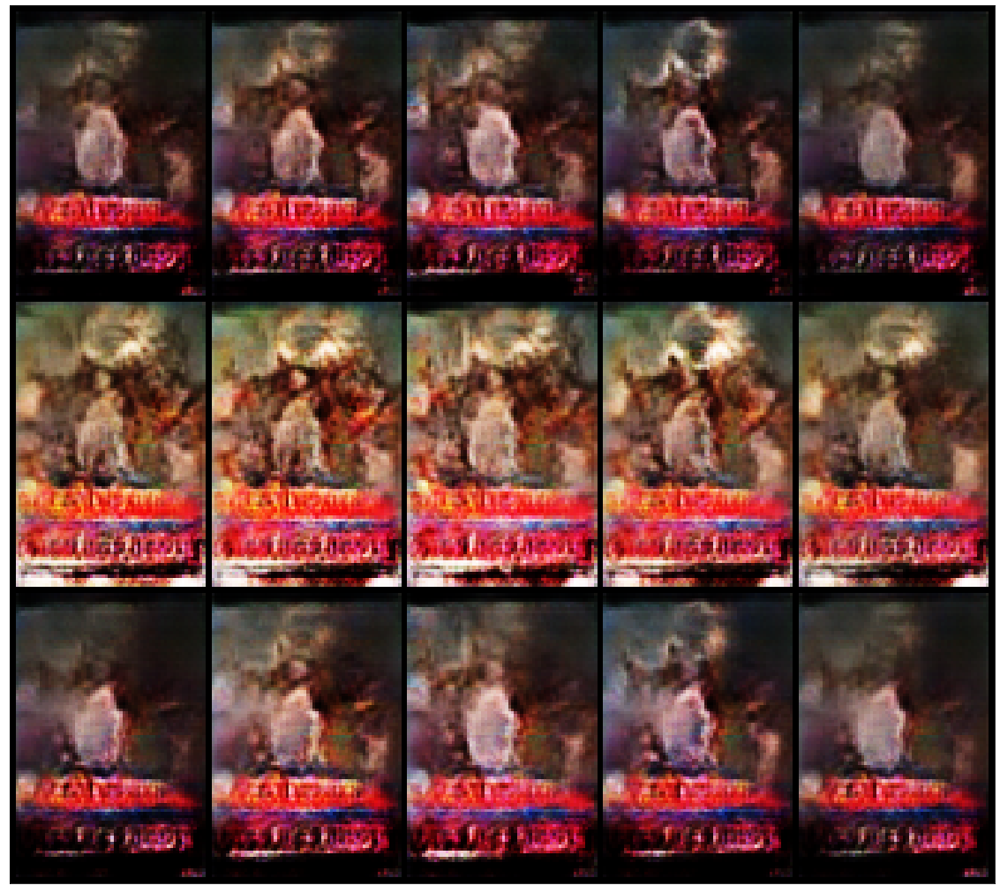

In [12]:
generator, _ = sncdcgan.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                               num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                               base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                               base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                               padding_mode=PADDING_MODE,
                                               num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS, device=device)
demonstrate_model("SNcDCGAN", generator, compute_kid=compute_kid, conditional=True)

In [13]:
generator, _ = rcdcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                              num_img_channels=NUM_IMG_CHANNELS,
                                              num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS,
                                              base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                              base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                              padding_mode=PADDING_MODE,
                                              device=device)
#demonstrate_model("RacDCGAN", generator, compute_kid=compute_kid, conditional=True)